In [263]:
import pandas as pd

In [264]:
df1 = pd.read_csv("/content/site_1_unseen_output.csv")

In [265]:
df2= pd.read_csv("/content/no2_site1_final.csv")

In [266]:
df3 = pd.read_csv("/content/unseen_predictions_o3_site1.csv")

In [267]:
# Create datetime and sort
df1['datetime'] = pd.to_datetime(
      df1['year'].astype(int).astype(str) + '-' +
      df1['month'].astype(int).astype(str) + '-' +
      df1['day'].astype(int).astype(str) + ' ' +
      df1['hour'].astype(int).astype(str) + ':00:00'
  )
df1.sort_values('datetime', inplace=True)
df1 = df1.reset_index(drop=True)

In [268]:
# # Create datetime and sort
# df2['datetime'] = pd.to_datetime(
#       df2['year'].astype(int).astype(str) + '-' +
#       df2['month'].astype(int).astype(str) + '-' +
#       df2['day'].astype(int).astype(str) + ' ' +
#       df2['hour'].astype(int).astype(str) + ':00:00'
#   )
# df2.sort_values('datetime', inplace=True)
# df2 = df2.reset_index(drop=True)

In [269]:
# # Create datetime and sort
# df3['datetime'] = pd.to_datetime(
#       df3['year'].astype(int).astype(str) + '-' +
#       df3['month'].astype(int).astype(str) + '-' +
#       df3['day'].astype(int).astype(str) + ' ' +
#       df3['hour'].astype(int).astype(str) + ':00:00'
#   )
# df3.sort_values('datetime', inplace=True)
# df3 = df3.reset_index(drop=True)

# SITE 1

RMSE O3: 20.084660382566494
R2 O3: 0.5894925495813623

RMSE NO2: 20.572580083305212
R2 NO2: 0.5063008452783688


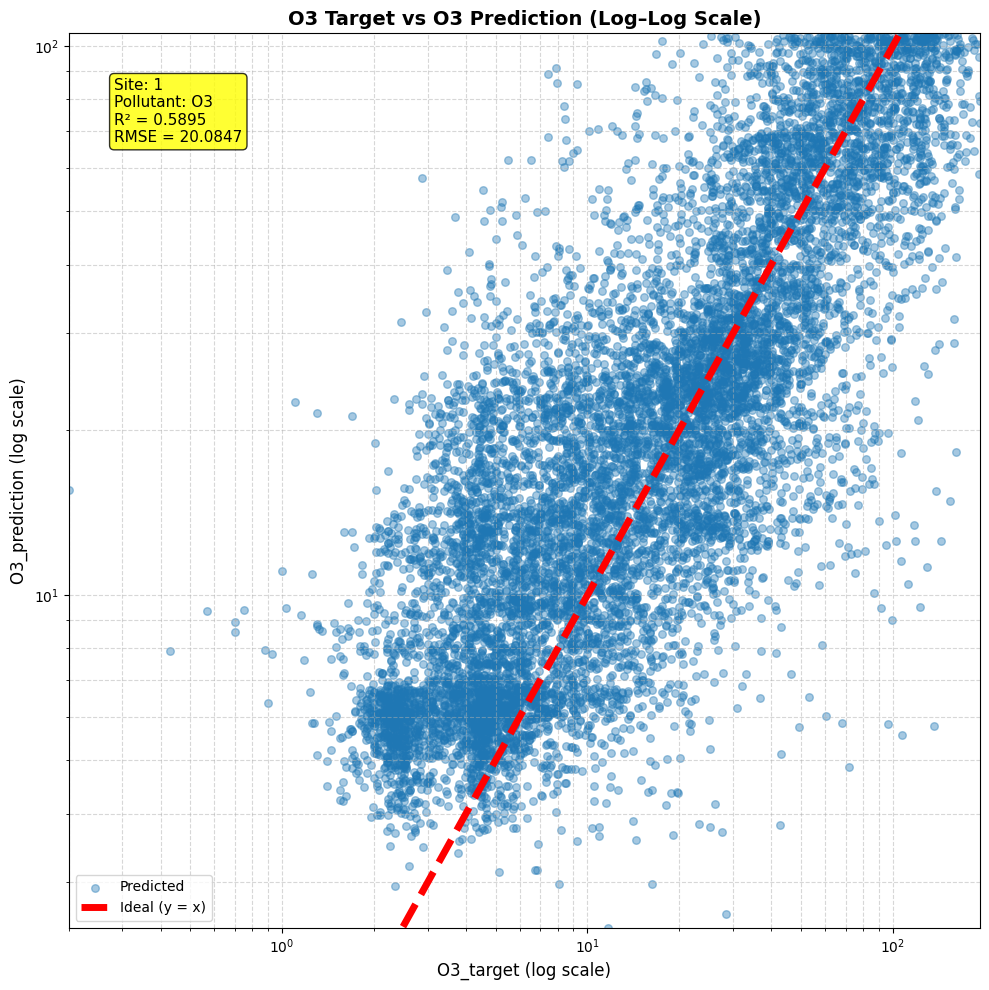

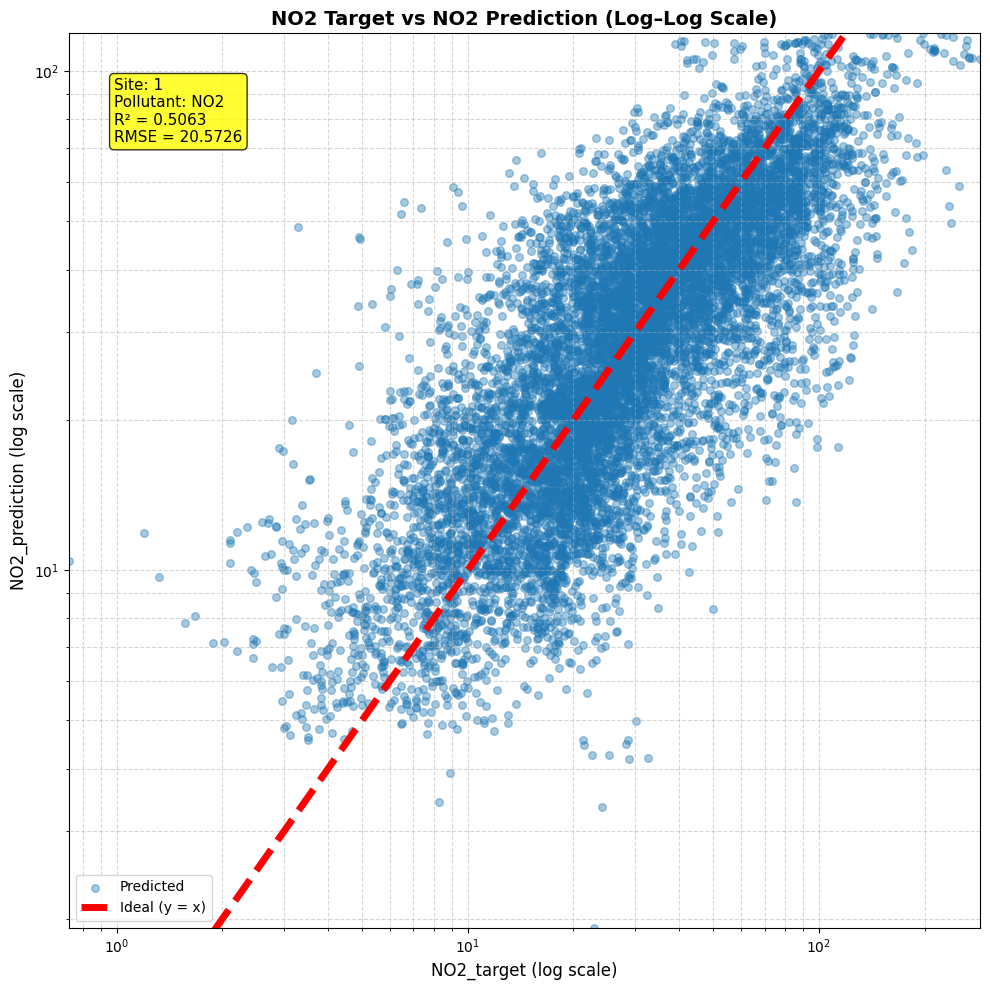

In [270]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Convert df2['datetime'] to datetime objects
df2['datetime'] = pd.to_datetime(df2['datetime'])
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

# Convert df3['datetime'] to datetime objects
df3['datetime'] = pd.to_datetime(df3['datetime'])
df3.sort_values('datetime', inplace=True)
df3 = df3.reset_index(drop=True)

# ----------------------------------------------------
# 2. Merge all dataframes
# ----------------------------------------------------
df = df1.merge(df2, on="datetime", how="inner")
df = df.merge(df3, on="datetime", how="inner")

# ----------------------------------------------------
# 3. Compute RMSE & R2
# ----------------------------------------------------
rmse_o3 = np.sqrt(mean_squared_error(df["O3_target"], df["O3_prediction"]))
rmse_no2 = np.sqrt(mean_squared_error(df["NO2_target"], df["NO2_prediction"]))
r2_o3 = r2_score(df["O3_target"], df["O3_prediction"])
r2_no2 = r2_score(df["NO2_target"], df["NO2_prediction"])

print("RMSE O3:", rmse_o3)
print("R2 O3:", r2_o3)
print()
print("RMSE NO2:", rmse_no2)
print("R2 NO2:", r2_no2)

# ----------------------------------------------------
# 4. Scatter plot helper (Log–Log)
# ----------------------------------------------------
def plot_scatter_loglog(target_col, pred_col, title, rmse, r2, site_num, pollutant):
    x = df[target_col].values
    y = df[pred_col].values

    # Avoid zero/negative values because log scale cannot plot them
    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    # Calculate percentiles to zoom where most points lie
    x_lower = np.percentile(x, 0)
    x_upper = np.percentile(x, 100)
    y_lower = np.percentile(y, 0)
    y_upper = np.percentile(y, 100)

    plt.figure(figsize=(10, 10))  # Increased size
    plt.scatter(x, y, alpha=0.4, s=30, label="Predicted")  # Reduced transparency (alpha=0.9)

    # Diagonal y = x reference
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    diag = np.linspace(lo, hi, 300)
    plt.plot(diag, diag, '--', linewidth=5, color='red', label="Ideal (y = x)")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel(target_col + " (log scale)", fontsize=12)
    plt.ylabel(pred_col + " (log scale)", fontsize=12)
    plt.title(title + " (Log–Log Scale)", fontsize=14, fontweight='bold')

    # Add text box with metrics
    textstr = f'Site: {site_num}\nPollutant: {pollutant}\nR² = {r2:.4f}\nRMSE = {rmse:.4f}'
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.8)
    plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=11,
             verticalalignment='top', bbox=props)

    plt.xlim(x_lower, x_upper)
    plt.ylim(y_lower, y_upper)

    plt.legend(fontsize=10)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()  # Removes extra space
    plt.show()

# ----------------------------------------------------
# 5. Generate scatter plots
# ----------------------------------------------------
plot_scatter_loglog("O3_target", "O3_prediction",
                    "O3 Target vs O3 Prediction",
                    rmse_o3, r2_o3, site_num=1, pollutant="O3")

plot_scatter_loglog("NO2_target", "NO2_prediction",
                    "NO2 Target vs NO2 Prediction",
                    rmse_no2, r2_no2, site_num=1, pollutant="NO2")

In [249]:
df1 = pd.read_csv("/content/site_2_unseen_output.csv")
df2= pd.read_csv("/content/no2_site2.csv")
df3 = pd.read_csv("/content/unseen_predictions_o3_site2.csv")

# Create datetime and sort
df1['datetime'] = pd.to_datetime(
      df1['year'].astype(int).astype(str) + '-' +
      df1['month'].astype(int).astype(str) + '-' +
      df1['day'].astype(int).astype(str) + ' ' +
      df1['hour'].astype(int).astype(str) + ':00:00'
  )
df1.sort_values('datetime', inplace=True)
df1 = df1.reset_index(drop=True)

# Create datetime and sort
# df2['datetime'] = pd.to_datetime(
#       df2['year'].astype(int).astype(str) + '-' +
#       df2['month'].astype(int).astype(str) + '-' +
#       df2['day'].astype(int).astype(str) + ' ' +
#       df2['hour'].astype(int).astype(str) + ':00:00'
#   )
# df2.sort_values('datetime', inplace=True)
# df2 = df2.reset_index(drop=True)

RMSE O3: 23.93345652929035
R2 O3: 0.43200427464619495

RMSE NO2: 17.115582774306386
R2 NO2: 0.5089904384050814


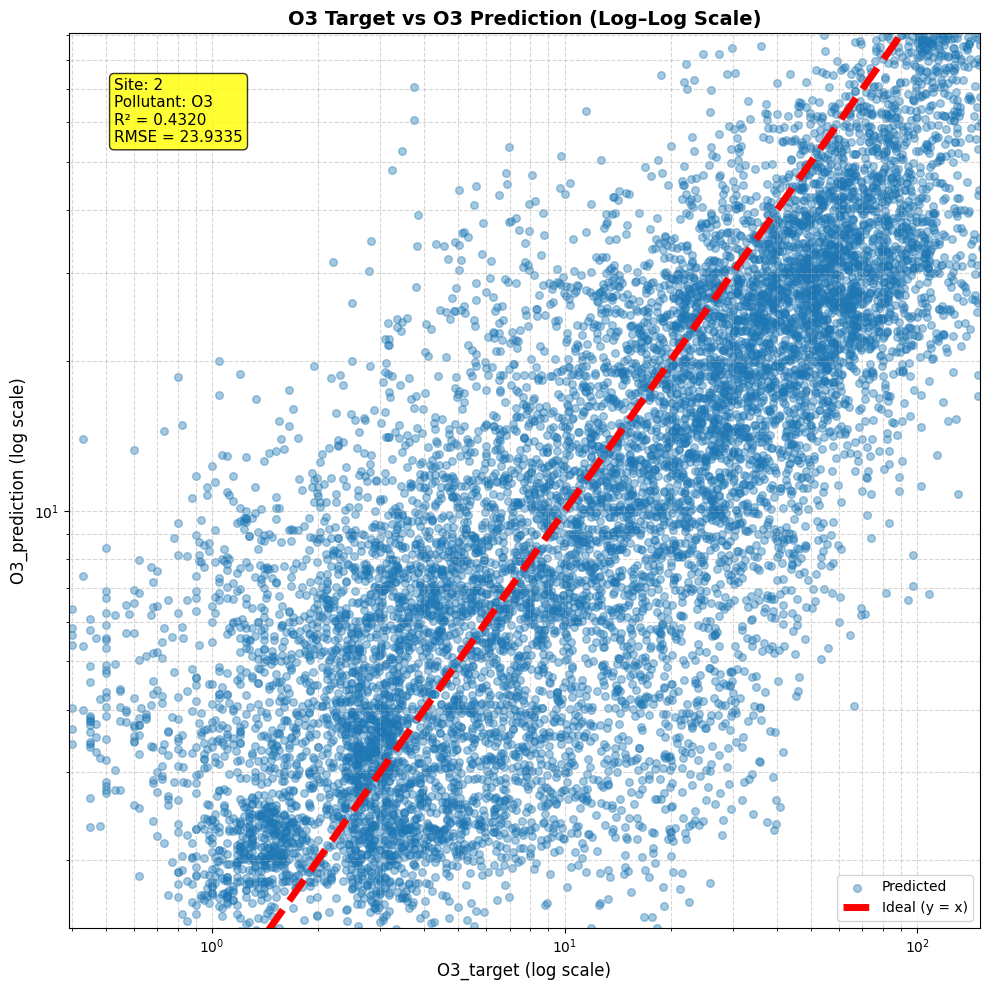

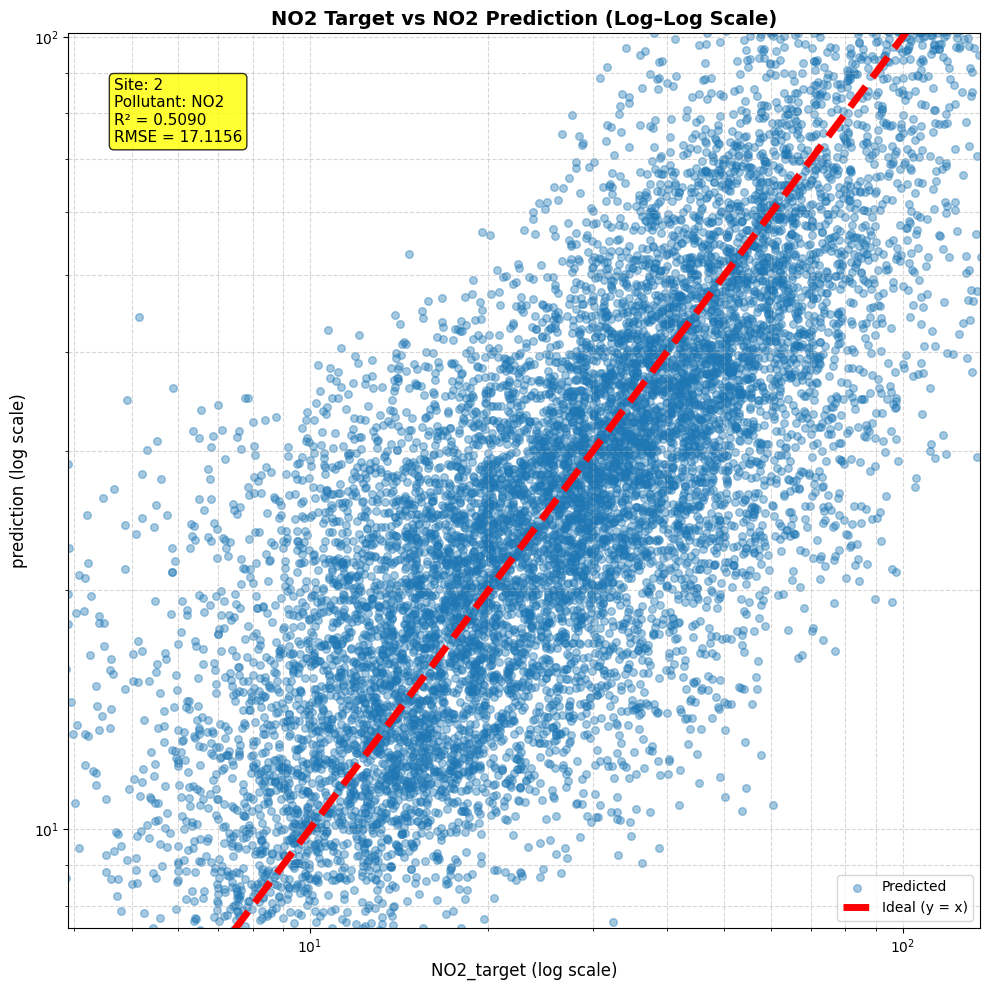

In [251]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Convert df2['datetime'] to datetime objects
df2['datetime'] = pd.to_datetime(df2['datetime'])
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

# Convert df3['datetime'] to datetime objects
df3['datetime'] = pd.to_datetime(df3['datetime'])
df3.sort_values('datetime', inplace=True)
df3 = df3.reset_index(drop=True)

# ----------------------------------------------------
# 2. Merge all dataframes
# ----------------------------------------------------
df = df1.merge(df2, on="datetime", how="inner")
df = df.merge(df3, on="datetime", how="inner")

# ----------------------------------------------------
# 3. Compute RMSE & R2
# ----------------------------------------------------
rmse_o3 = np.sqrt(mean_squared_error(df["O3_target"], df["O3_prediction"]))
rmse_no2 = np.sqrt(mean_squared_error(df["NO2_target"], df["prediction"]))
r2_o3 = r2_score(df["O3_target"], df["O3_prediction"])
r2_no2 = r2_score(df["NO2_target"], df["prediction"])

print("RMSE O3:", rmse_o3)
print("R2 O3:", r2_o3)
print()
print("RMSE NO2:", rmse_no2)
print("R2 NO2:", r2_no2)

# ----------------------------------------------------
# 4. Scatter plot helper (Log–Log)
# ----------------------------------------------------
def plot_scatter_loglog(target_col, pred_col, title, rmse, r2, site_num, pollutant):
    x = df[target_col].values
    y = df[pred_col].values

    # Avoid zero/negative values because log scale cannot plot them
    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    # Calculate percentiles to zoom where most points lie
    # Calculate percentiles to zoom where most points lie
    x_lower = np.percentile(x, 0.5)
    x_upper = np.percentile(x, 99.5)
    y_lower = np.percentile(y, 0.5)
    y_upper = np.percentile(y, 99.5)

    plt.figure(figsize=(10, 10))  # Increased size
    plt.scatter(x, y, alpha=0.4, s=30, label="Predicted")  # Reduced transparency (alpha=0.9)

    # Diagonal y = x reference
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    diag = np.linspace(lo, hi, 300)
    plt.plot(diag, diag, '--', linewidth=5, color='red', label="Ideal (y = x)")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel(target_col + " (log scale)", fontsize=12)
    plt.ylabel(pred_col + " (log scale)", fontsize=12)
    plt.title(title + " (Log–Log Scale)", fontsize=14, fontweight='bold')

    # Add text box with metrics
    textstr = f'Site: {site_num}\nPollutant: {pollutant}\nR² = {r2:.4f}\nRMSE = {rmse:.4f}'
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.8)
    plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=11,
             verticalalignment='top', bbox=props)

    # Zoom to where most points lie (5th to 95th percentile)
    plt.xlim(x_lower, x_upper)
    plt.ylim(y_lower, y_upper)

    plt.legend(fontsize=10)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()  # Removes extra space
    plt.show()

# ----------------------------------------------------
# 5. Generate scatter plots
# ----------------------------------------------------
plot_scatter_loglog("O3_target", "O3_prediction",
                    "O3 Target vs O3 Prediction",
                    rmse_o3, r2_o3, site_num=2, pollutant="O3")

plot_scatter_loglog("NO2_target", "prediction",
                    "NO2 Target vs NO2 Prediction",
                    rmse_no2, r2_no2, site_num=2, pollutant="NO2")

In [252]:
df1 = pd.read_csv("/content/site_3_unseen_output.csv")
df2= pd.read_csv("/content/no2_site3.csv")
df3 = pd.read_csv("/content/unseen_predictions_o3_site3.csv")

# Create datetime and sort
df1['datetime'] = pd.to_datetime(
      df1['year'].astype(int).astype(str) + '-' +
      df1['month'].astype(int).astype(str) + '-' +
      df1['day'].astype(int).astype(str) + ' ' +
      df1['hour'].astype(int).astype(str) + ':00:00'
  )
df1.sort_values('datetime', inplace=True)
df1 = df1.reset_index(drop=True)

# Create datetime and sort
# df2['datetime'] = pd.to_datetime(
#       df2['year'].astype(int).astype(str) + '-' +
#       df2['month'].astype(int).astype(str) + '-' +
#       df2['day'].astype(int).astype(str) + ' ' +
#       df2['hour'].astype(int).astype(str) + ':00:00'
#   )
# df2.sort_values('datetime', inplace=True)
# df2 = df2.reset_index(drop=True)

/tmp/ipython-input-1829452398.py:7: UserWarning: Parsing dates in %d-%m-%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df2['datetime'] = pd.to_datetime(df2['datetime'])


RMSE O3: 26.4024281455706
R2 O3: 0.5657720591493105

RMSE NO2: 23.137280423654097
R2 NO2: 0.539964730252495


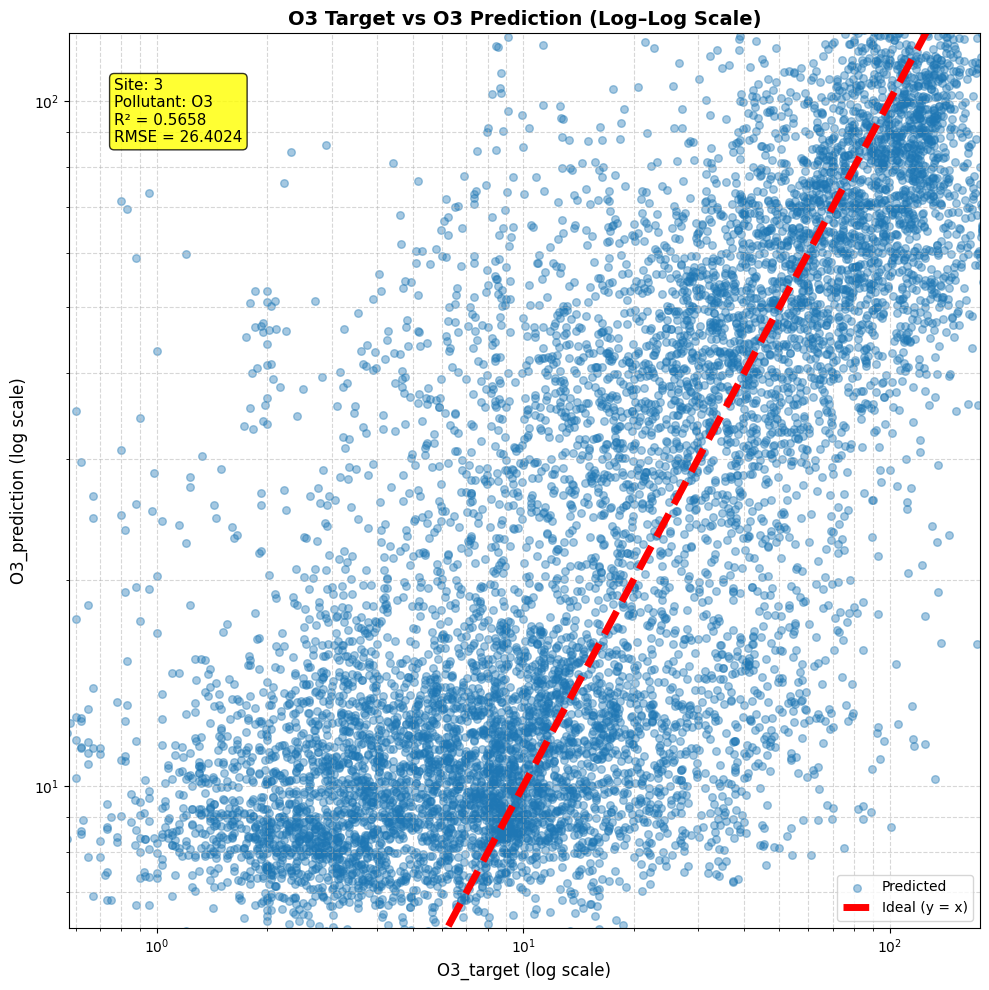

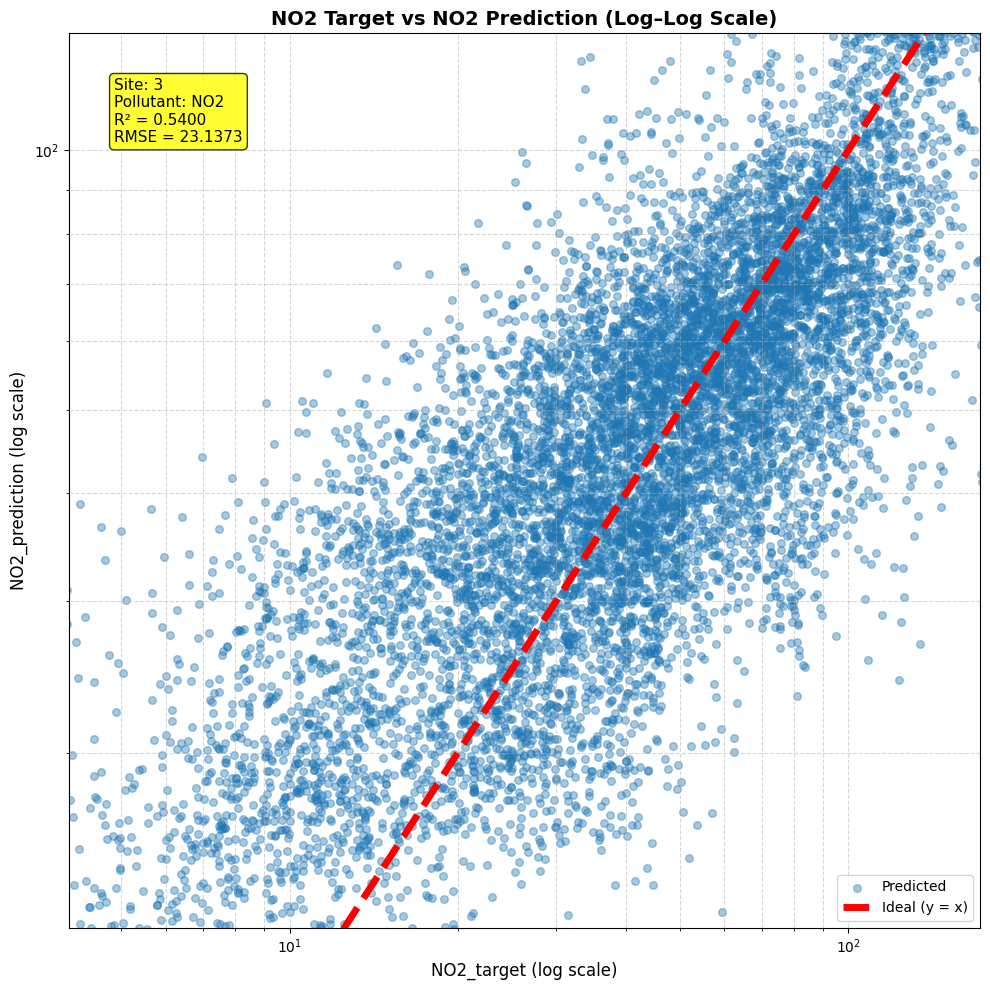

In [253]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Convert df2['datetime'] to datetime objects
df2['datetime'] = pd.to_datetime(df2['datetime'])
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

# Convert df3['datetime'] to datetime objects
df3['datetime'] = pd.to_datetime(df3['datetime'])
df3.sort_values('datetime', inplace=True)
df3 = df3.reset_index(drop=True)

# ----------------------------------------------------
# 2. Merge all dataframes
# ----------------------------------------------------
df = df1.merge(df2, on="datetime", how="inner")
df = df.merge(df3, on="datetime", how="inner")

# ----------------------------------------------------
# 3. Compute RMSE & R2
# ----------------------------------------------------
rmse_o3 = np.sqrt(mean_squared_error(df["O3_target"], df["O3_prediction"]))
rmse_no2 = np.sqrt(mean_squared_error(df["NO2_target"], df["NO2_prediction"]))
r2_o3 = r2_score(df["O3_target"], df["O3_prediction"])
r2_no2 = r2_score(df["NO2_target"], df["NO2_prediction"])

print("RMSE O3:", rmse_o3)
print("R2 O3:", r2_o3)
print()
print("RMSE NO2:", rmse_no2)
print("R2 NO2:", r2_no2)

# ----------------------------------------------------
# 4. Scatter plot helper (Log–Log)
# ----------------------------------------------------
def plot_scatter_loglog(target_col, pred_col, title, rmse, r2, site_num, pollutant):
    x = df[target_col].values
    y = df[pred_col].values

    # Avoid zero/negative values because log scale cannot plot them
    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    # Calculate percentiles to zoom where most points lie
    x_lower = np.percentile(x, 0.5)
    x_upper = np.percentile(x, 99.5)
    y_lower = np.percentile(y, 0.5)
    y_upper = np.percentile(y, 99.5)

    plt.figure(figsize=(10, 10))  # Increased size
    plt.scatter(x, y, alpha=0.4, s=30, label="Predicted")  # Reduced transparency (alpha=0.9)

    # Diagonal y = x reference
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    diag = np.linspace(lo, hi, 300)
    plt.plot(diag, diag, '--', linewidth=5, color='red', label="Ideal (y = x)")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel(target_col + " (log scale)", fontsize=12)
    plt.ylabel(pred_col + " (log scale)", fontsize=12)
    plt.title(title + " (Log–Log Scale)", fontsize=14, fontweight='bold')

    # Add text box with metrics
    textstr = f'Site: {site_num}\nPollutant: {pollutant}\nR² = {r2:.4f}\nRMSE = {rmse:.4f}'
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.8)
    plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=11,
             verticalalignment='top', bbox=props)

    # Zoom to where most points lie (5th to 95th percentile)
    plt.xlim(x_lower, x_upper)
    plt.ylim(y_lower, y_upper)

    plt.legend(fontsize=10)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()  # Removes extra space
    plt.show()

# ----------------------------------------------------
# 5. Generate scatter plots
# ----------------------------------------------------
plot_scatter_loglog("O3_target", "O3_prediction",
                    "O3 Target vs O3 Prediction",
                    rmse_o3, r2_o3, site_num=3, pollutant="O3")

plot_scatter_loglog("NO2_target", "NO2_prediction",
                    "NO2 Target vs NO2 Prediction",
                    rmse_no2, r2_no2, site_num=3, pollutant="NO2")

In [204]:
df1 = pd.read_csv("/content/site_4_unseen_output.csv")
df2= pd.read_csv("/content/no2_site4.csv")
df3 = pd.read_csv("/content/unseen_predictions_o3_site4.csv")

# Create datetime and sort
df1['datetime'] = pd.to_datetime(
      df1['year'].astype(int).astype(str) + '-' +
      df1['month'].astype(int).astype(str) + '-' +
      df1['day'].astype(int).astype(str) + ' ' +
      df1['hour'].astype(int).astype(str) + ':00:00'
  )
df1.sort_values('datetime', inplace=True)
df1 = df1.reset_index(drop=True)

# Create datetime and sort
# df2['datetime'] = pd.to_datetime(
#       df2['year'].astype(int).astype(str) + '-' +
#       df2['month'].astype(int).astype(str) + '-' +
#       df2['day'].astype(int).astype(str) + ' ' +
#       df2['hour'].astype(int).astype(str) + ':00:00'
#   )
# df2.sort_values('datetime', inplace=True)
# df2 = df2.reset_index(drop=True)

RMSE O3: 21.86471568176556
R2 O3: 0.6636550701280788

RMSE NO2: 16.973832512954505
R2 NO2: 0.4896489403020745


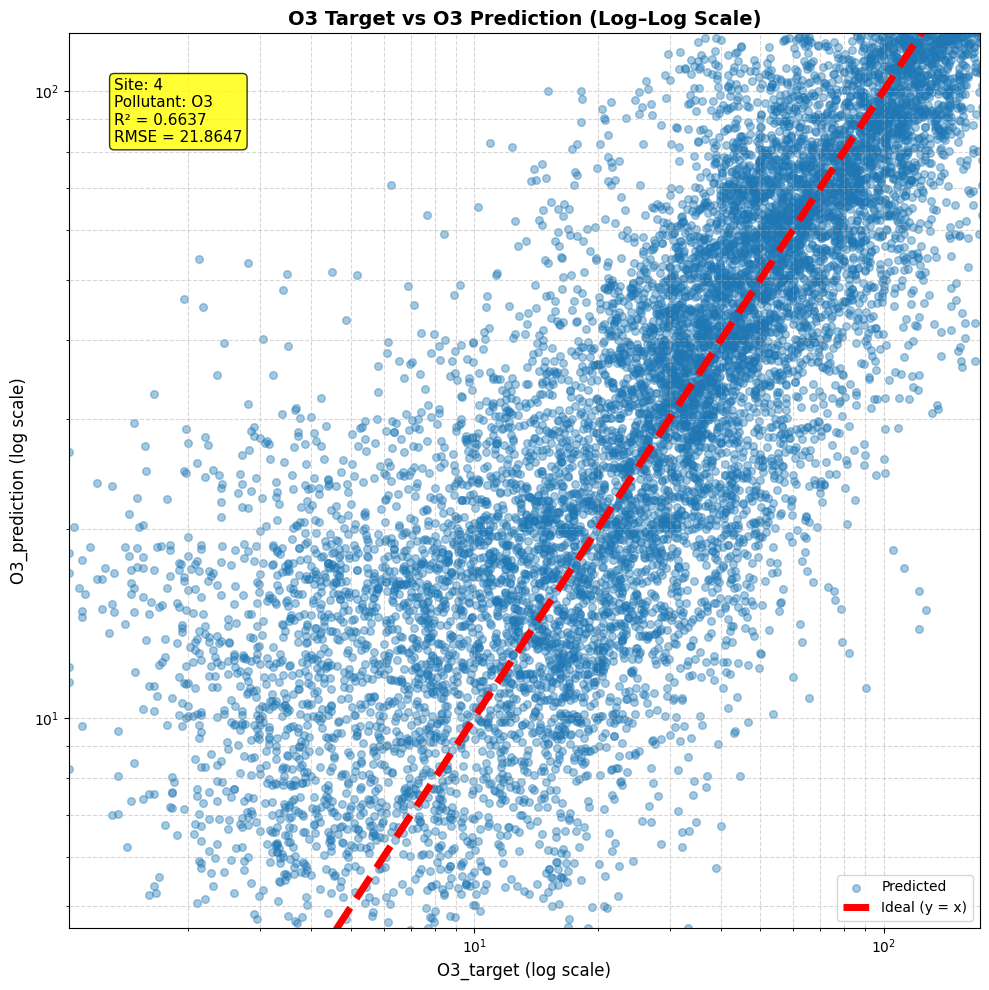

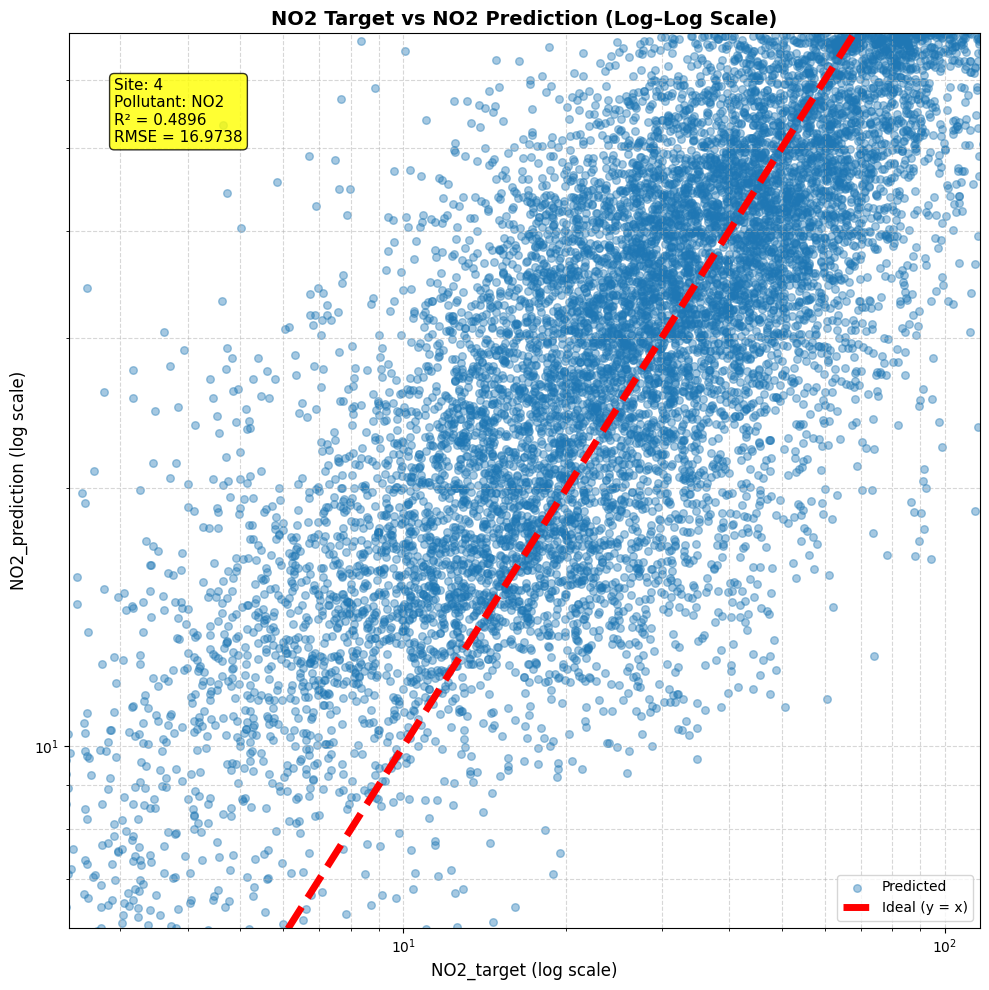

In [205]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Convert df2['datetime'] to datetime objects
df2['datetime'] = pd.to_datetime(df2['datetime'])
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

# Convert df3['datetime'] to datetime objects
df3['datetime'] = pd.to_datetime(df3['datetime'])
df3.sort_values('datetime', inplace=True)
df3 = df3.reset_index(drop=True)

# ----------------------------------------------------
# 2. Merge all dataframes
# ----------------------------------------------------
df = df1.merge(df2, on="datetime", how="inner")
df = df.merge(df3, on="datetime", how="inner")

# ----------------------------------------------------
# 3. Compute RMSE & R2
# ----------------------------------------------------
rmse_o3 = np.sqrt(mean_squared_error(df["O3_target"], df["O3_prediction"]))
rmse_no2 = np.sqrt(mean_squared_error(df["NO2_target"], df["NO2_prediction"]))
r2_o3 = r2_score(df["O3_target"], df["O3_prediction"])
r2_no2 = r2_score(df["NO2_target"], df["NO2_prediction"])

print("RMSE O3:", rmse_o3)
print("R2 O3:", r2_o3)
print()
print("RMSE NO2:", rmse_no2)
print("R2 NO2:", r2_no2)

# ----------------------------------------------------
# 4. Scatter plot helper (Log–Log)
# ----------------------------------------------------
def plot_scatter_loglog(target_col, pred_col, title, rmse, r2, site_num, pollutant):
    x = df[target_col].values
    y = df[pred_col].values

    # Avoid zero/negative values because log scale cannot plot them
    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    # Calculate percentiles to zoom where most points lie
    x_lower = np.percentile(x, 0.5)
    x_upper = np.percentile(x, 99.5)
    y_lower = np.percentile(y, 0.5)
    y_upper = np.percentile(y, 99.5)

    plt.figure(figsize=(10, 10))  # Increased size
    plt.scatter(x, y, alpha=0.4, s=30, label="Predicted")  # Reduced transparency (alpha=0.9)

    # Diagonal y = x reference
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    diag = np.linspace(lo, hi, 300)
    plt.plot(diag, diag, '--', linewidth=5, color='red', label="Ideal (y = x)")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel(target_col + " (log scale)", fontsize=12)
    plt.ylabel(pred_col + " (log scale)", fontsize=12)
    plt.title(title + " (Log–Log Scale)", fontsize=14, fontweight='bold')

    # Add text box with metrics
    textstr = f'Site: {site_num}\nPollutant: {pollutant}\nR² = {r2:.4f}\nRMSE = {rmse:.4f}'
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.8)
    plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=11,
             verticalalignment='top', bbox=props)

    # Zoom to where most points lie (5th to 95th percentile)
    plt.xlim(x_lower, x_upper)
    plt.ylim(y_lower, y_upper)

    plt.legend(fontsize=10)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()  # Removes extra space
    plt.show()

# ----------------------------------------------------
# 5. Generate scatter plots
# ----------------------------------------------------
plot_scatter_loglog("O3_target", "O3_prediction",
                    "O3 Target vs O3 Prediction",
                    rmse_o3, r2_o3, site_num=4, pollutant="O3")

plot_scatter_loglog("NO2_target", "NO2_prediction",
                    "NO2 Target vs NO2 Prediction",
                    rmse_no2, r2_no2, site_num=4, pollutant="NO2")

In [206]:
df1 = pd.read_csv("/content/site_5_unseen_output.csv")
df2= pd.read_csv("/content/no2_site5.csv")
df3 = pd.read_csv("/content/unseen_predictions_o3_site5.csv")

# Create datetime and sort
df1['datetime'] = pd.to_datetime(
      df1['year'].astype(int).astype(str) + '-' +
      df1['month'].astype(int).astype(str) + '-' +
      df1['day'].astype(int).astype(str) + ' ' +
      df1['hour'].astype(int).astype(str) + ':00:00'
  )
df1.sort_values('datetime', inplace=True)
df1 = df1.reset_index(drop=True)


df2['datetime'] = pd.to_datetime(
      df2['year'].astype(int).astype(str) + '-' +
      df2['month'].astype(int).astype(str) + '-' +
      df2['day'].astype(int).astype(str) + ' ' +
      df2['hour'].astype(int).astype(str) + ':00:00'
  )
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

RMSE O3: 24.67692748611371
R2 O3: 0.3915950129325555

RMSE NO2: 24.33311890746571
R2 NO2: 0.5231362325670874


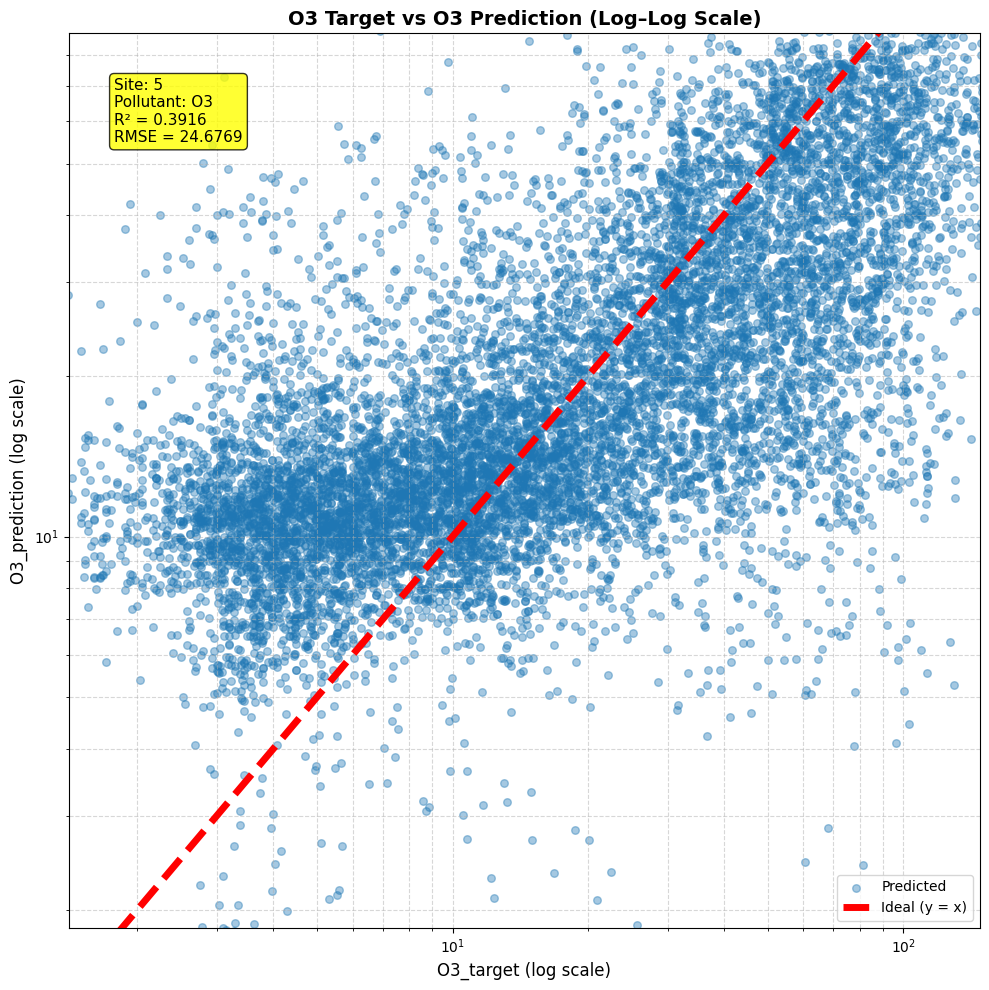

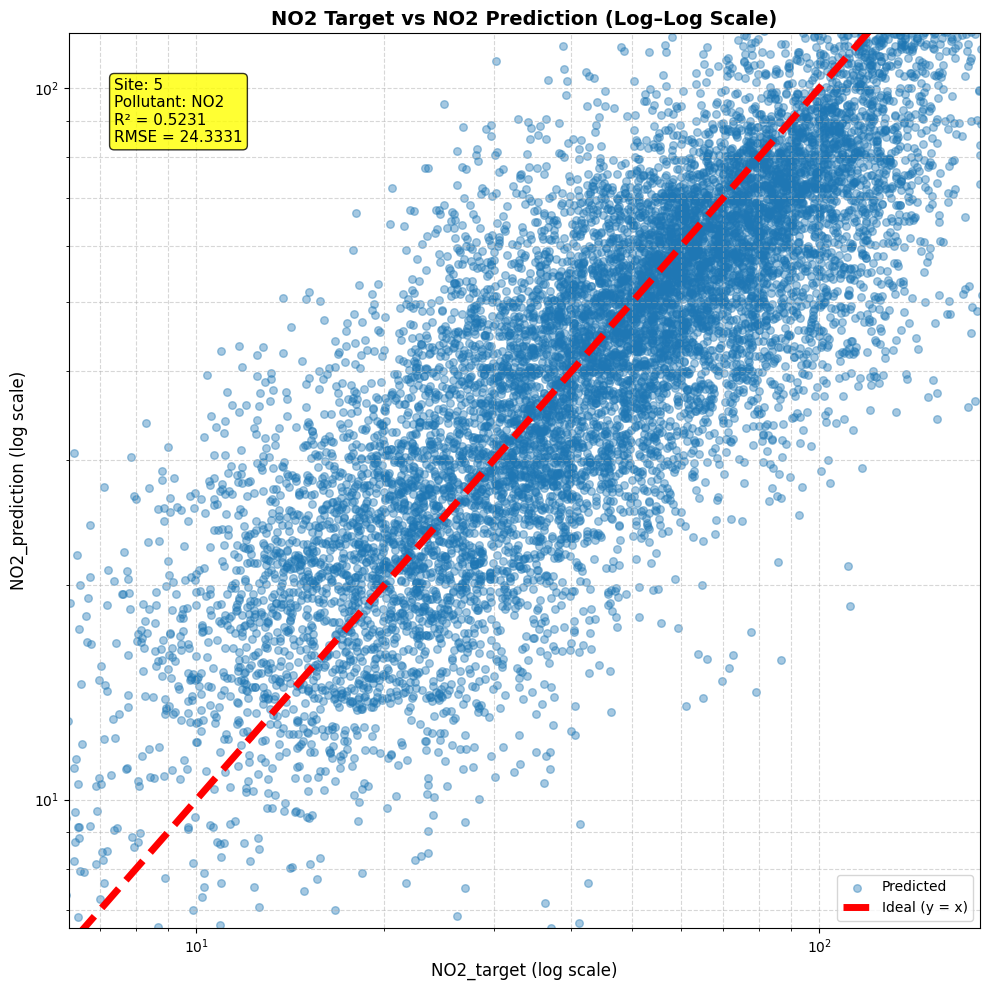

In [207]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Convert df2['datetime'] to datetime objects
df2['datetime'] = pd.to_datetime(df2['datetime'])
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

# Convert df3['datetime'] to datetime objects
df3['datetime'] = pd.to_datetime(df3['datetime'])
df3.sort_values('datetime', inplace=True)
df3 = df3.reset_index(drop=True)

# ----------------------------------------------------
# 2. Merge all dataframes
# ----------------------------------------------------
df = df1.merge(df2, on="datetime", how="inner")
df = df.merge(df3, on="datetime", how="inner")

# ----------------------------------------------------
# 3. Compute RMSE & R2
# ----------------------------------------------------
rmse_o3 = np.sqrt(mean_squared_error(df["O3_target"], df["O3_prediction"]))
rmse_no2 = np.sqrt(mean_squared_error(df["NO2_target"], df["NO2_prediction"]))
r2_o3 = r2_score(df["O3_target"], df["O3_prediction"])
r2_no2 = r2_score(df["NO2_target"], df["NO2_prediction"])

print("RMSE O3:", rmse_o3)
print("R2 O3:", r2_o3)
print()
print("RMSE NO2:", rmse_no2)
print("R2 NO2:", r2_no2)

# ----------------------------------------------------
# 4. Scatter plot helper (Log–Log)
# ----------------------------------------------------
def plot_scatter_loglog(target_col, pred_col, title, rmse, r2, site_num, pollutant):
    x = df[target_col].values
    y = df[pred_col].values

    # Avoid zero/negative values because log scale cannot plot them
    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    # Calculate percentiles to zoom where most points lie
    x_lower = np.percentile(x, 0.5)
    x_upper = np.percentile(x, 99.5)
    y_lower = np.percentile(y, 0.5)
    y_upper = np.percentile(y, 99.5)

    plt.figure(figsize=(10, 10))  # Increased size
    plt.scatter(x, y, alpha=0.4, s=30, label="Predicted")  # Reduced transparency (alpha=0.9)

    # Diagonal y = x reference
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    diag = np.linspace(lo, hi, 300)
    plt.plot(diag, diag, '--', linewidth=5, color='red', label="Ideal (y = x)")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel(target_col + " (log scale)", fontsize=12)
    plt.ylabel(pred_col + " (log scale)", fontsize=12)
    plt.title(title + " (Log–Log Scale)", fontsize=14, fontweight='bold')

    # Add text box with metrics
    textstr = f'Site: {site_num}\nPollutant: {pollutant}\nR² = {r2:.4f}\nRMSE = {rmse:.4f}'
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.8)
    plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=11,
             verticalalignment='top', bbox=props)

    # Zoom to where most points lie (5th to 95th percentile)
    plt.xlim(x_lower, x_upper)
    plt.ylim(y_lower, y_upper)

    plt.legend(fontsize=10)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()  # Removes extra space
    plt.show()

# ----------------------------------------------------
# 5. Generate scatter plots
# ----------------------------------------------------
plot_scatter_loglog("O3_target", "O3_prediction",
                    "O3 Target vs O3 Prediction",
                    rmse_o3, r2_o3, site_num=5, pollutant="O3")

plot_scatter_loglog("NO2_target", "NO2_prediction",
                    "NO2 Target vs NO2 Prediction",
                    rmse_no2, r2_no2, site_num=5, pollutant="NO2")

In [208]:
df1 = pd.read_csv("/content/site_6_unseen_output.csv")
df2= pd.read_csv("/content/no2_site6.csv")
df3 = pd.read_csv("/content/unseen_predictions_o3_site6.csv")

# Create datetime and sort
df1['datetime'] = pd.to_datetime(
      df1['year'].astype(int).astype(str) + '-' +
      df1['month'].astype(int).astype(str) + '-' +
      df1['day'].astype(int).astype(str) + ' ' +
      df1['hour'].astype(int).astype(str) + ':00:00'
  )
df1.sort_values('datetime', inplace=True)
df1 = df1.reset_index(drop=True)


# df2['datetime'] = pd.to_datetime(
#       df2['year'].astype(int).astype(str) + '-' +
#       df2['month'].astype(int).astype(str) + '-' +
#       df2['day'].astype(int).astype(str) + ' ' +
#       df2['hour'].astype(int).astype(str) + ':00:00'
#   )
# df2.sort_values('datetime', inplace=True)
# df2 = df2.reset_index(drop=True)

RMSE O3: 23.071692520043207
R2 O3: 0.3540699983121659

RMSE NO2: 14.404194720122655
R2 NO2: 0.4612907727988824


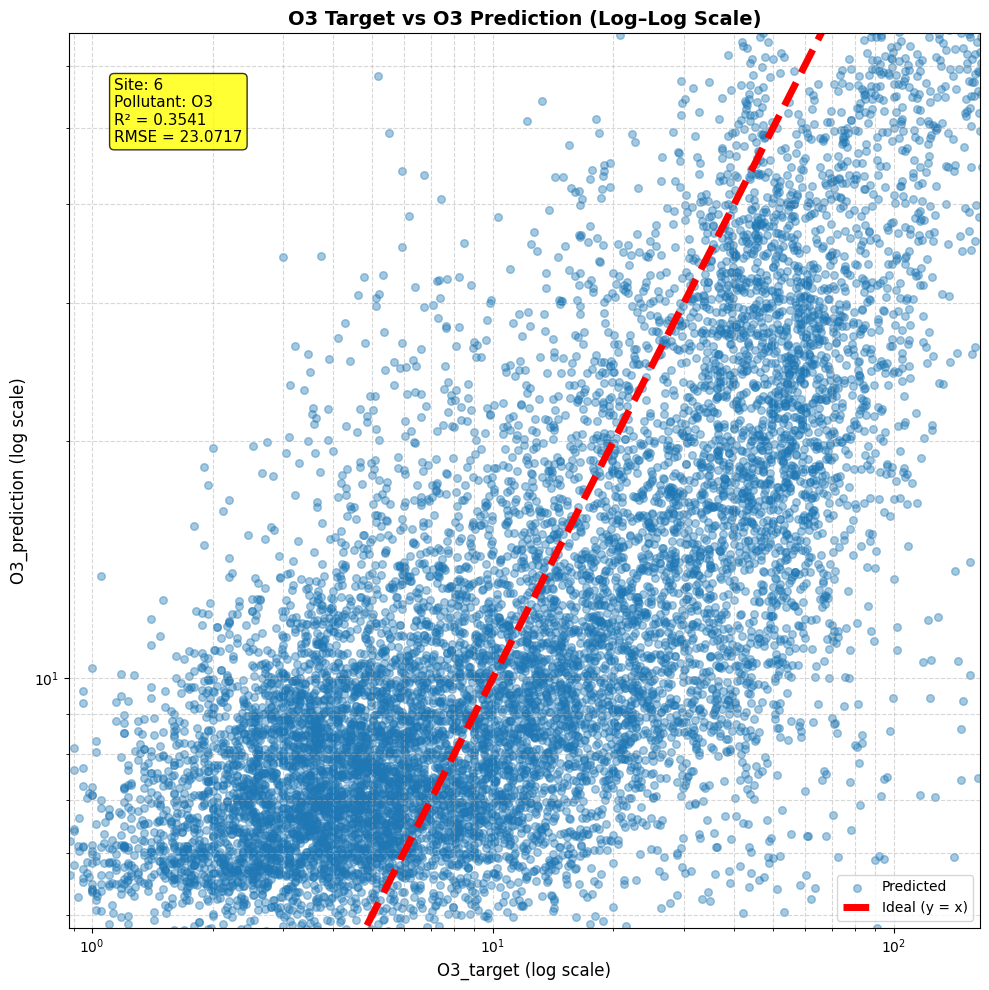

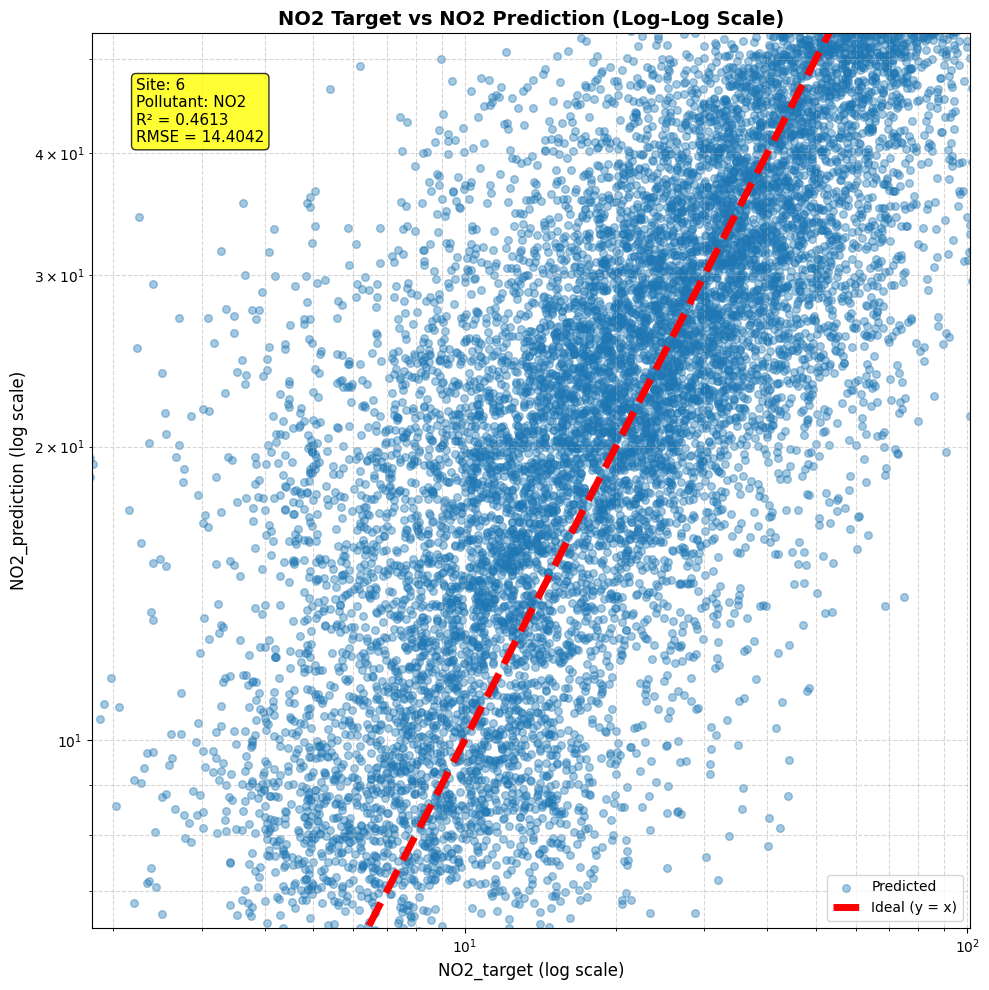

In [209]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Convert df2['datetime'] to datetime objects
df2['datetime'] = pd.to_datetime(df2['datetime'])
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

# Convert df3['datetime'] to datetime objects
df3['datetime'] = pd.to_datetime(df3['datetime'])
df3.sort_values('datetime', inplace=True)
df3 = df3.reset_index(drop=True)

# ----------------------------------------------------
# 2. Merge all dataframes
# ----------------------------------------------------
df = df1.merge(df2, on="datetime", how="inner")
df = df.merge(df3, on="datetime", how="inner")

# ----------------------------------------------------
# 3. Compute RMSE & R2
# ----------------------------------------------------
rmse_o3 = np.sqrt(mean_squared_error(df["O3_target"], df["O3_prediction"]))
rmse_no2 = np.sqrt(mean_squared_error(df["NO2_target"], df["NO2_prediction"]))
r2_o3 = r2_score(df["O3_target"], df["O3_prediction"])
r2_no2 = r2_score(df["NO2_target"], df["NO2_prediction"])

print("RMSE O3:", rmse_o3)
print("R2 O3:", r2_o3)
print()
print("RMSE NO2:", rmse_no2)
print("R2 NO2:", r2_no2)

# ----------------------------------------------------
# 4. Scatter plot helper (Log–Log)
# ----------------------------------------------------
def plot_scatter_loglog(target_col, pred_col, title, rmse, r2, site_num, pollutant):
    x = df[target_col].values
    y = df[pred_col].values

    # Avoid zero/negative values because log scale cannot plot them
    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    # Calculate percentiles to zoom where most points lie
    x_lower = np.percentile(x, 0.5)
    x_upper = np.percentile(x, 99.5)
    y_lower = np.percentile(y, 0.5)
    y_upper = np.percentile(y, 99.5)

    plt.figure(figsize=(10, 10))  # Increased size
    plt.scatter(x, y, alpha=0.4, s=30, label="Predicted")  # Reduced transparency (alpha=0.9)

    # Diagonal y = x reference
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    diag = np.linspace(lo, hi, 300)
    plt.plot(diag, diag, '--', linewidth=5, color='red', label="Ideal (y = x)")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel(target_col + " (log scale)", fontsize=12)
    plt.ylabel(pred_col + " (log scale)", fontsize=12)
    plt.title(title + " (Log–Log Scale)", fontsize=14, fontweight='bold')

    # Add text box with metrics
    textstr = f'Site: {site_num}\nPollutant: {pollutant}\nR² = {r2:.4f}\nRMSE = {rmse:.4f}'
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.8)
    plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=11,
             verticalalignment='top', bbox=props)

    # Zoom to where most points lie (5th to 95th percentile)
    plt.xlim(x_lower, x_upper)
    plt.ylim(y_lower, y_upper)

    plt.legend(fontsize=10)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()  # Removes extra space
    plt.show()

# ----------------------------------------------------
# 5. Generate scatter plots
# ----------------------------------------------------
plot_scatter_loglog("O3_target", "O3_prediction",
                    "O3 Target vs O3 Prediction",
                    rmse_o3, r2_o3, site_num=6, pollutant="O3")

plot_scatter_loglog("NO2_target", "NO2_prediction",
                    "NO2 Target vs NO2 Prediction",
                    rmse_no2, r2_no2, site_num=6, pollutant="NO2")

In [210]:
df1 = pd.read_csv("/content/site_7_unseen_output.csv")
df2= pd.read_csv("/content/no2_site7.csv")
df3 = pd.read_csv("/content/unseen_predictions_o3_site7.csv")

# Create datetime and sort
df1['datetime'] = pd.to_datetime(
      df1['year'].astype(int).astype(str) + '-' +
      df1['month'].astype(int).astype(str) + '-' +
      df1['day'].astype(int).astype(str) + ' ' +
      df1['hour'].astype(int).astype(str) + ':00:00'
  )
df1.sort_values('datetime', inplace=True)
df1 = df1.reset_index(drop=True)


df2['datetime'] = pd.to_datetime(
      df2['year'].astype(int).astype(str) + '-' +
      df2['month'].astype(int).astype(str) + '-' +
      df2['day'].astype(int).astype(str) + ' ' +
      df2['hour'].astype(int).astype(str) + ':00:00'
  )
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

RMSE O3: 26.078345441535756
R2 O3: 0.507792485454414

RMSE NO2: 17.75724826284299
R2 NO2: 0.42565714852993886


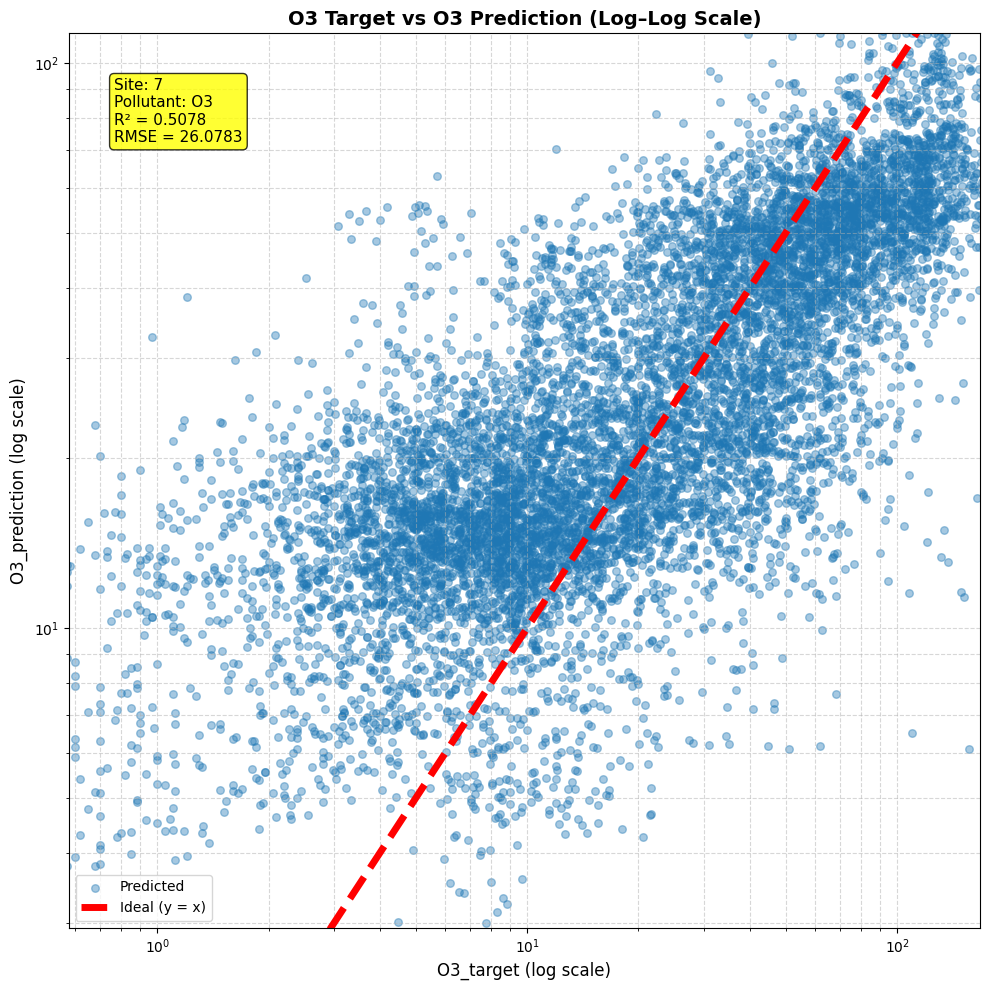

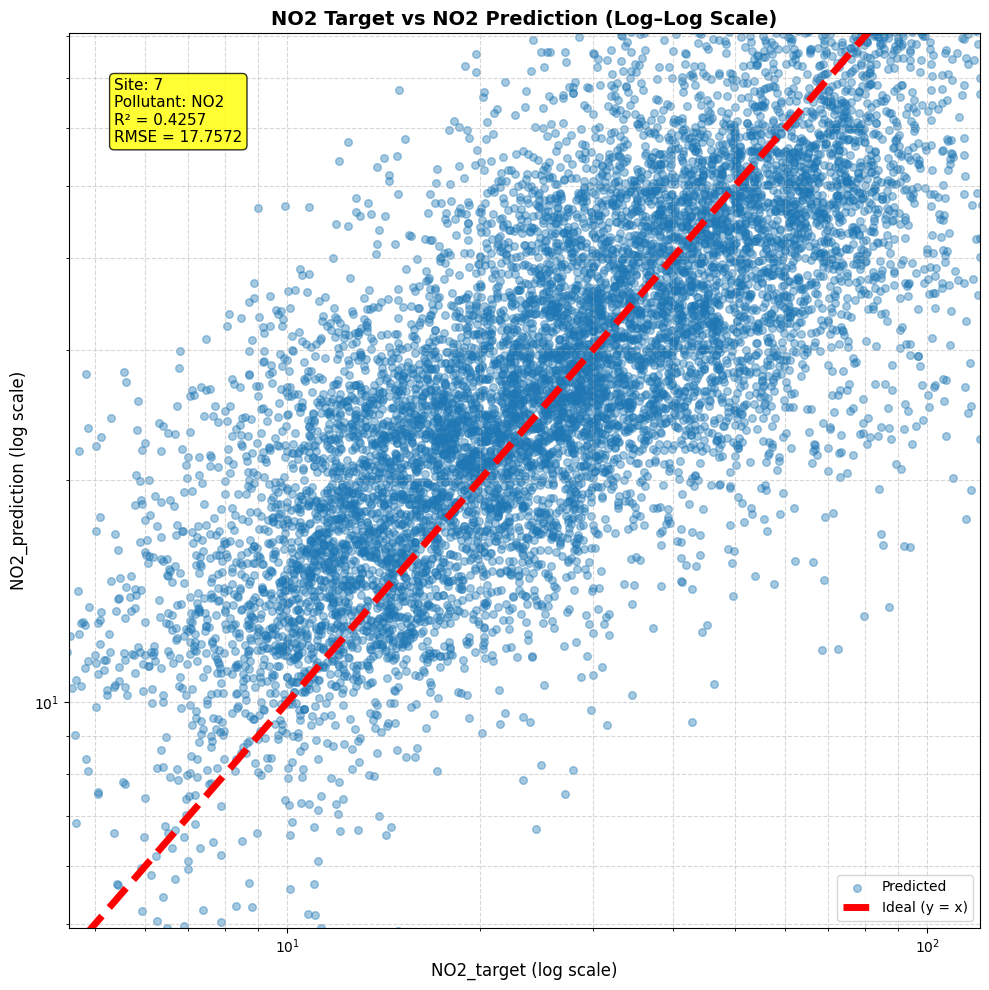

In [211]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Convert df2['datetime'] to datetime objects
df2['datetime'] = pd.to_datetime(df2['datetime'])
df2.sort_values('datetime', inplace=True)
df2 = df2.reset_index(drop=True)

# Convert df3['datetime'] to datetime objects
df3['datetime'] = pd.to_datetime(df3['datetime'])
df3.sort_values('datetime', inplace=True)
df3 = df3.reset_index(drop=True)

# ----------------------------------------------------
# 2. Merge all dataframes
# ----------------------------------------------------
df = df1.merge(df2, on="datetime", how="inner")
df = df.merge(df3, on="datetime", how="inner")

# ----------------------------------------------------
# 3. Compute RMSE & R2
# ----------------------------------------------------
rmse_o3 = np.sqrt(mean_squared_error(df["O3_target"], df["O3_prediction"]))
rmse_no2 = np.sqrt(mean_squared_error(df["NO2_target"], df["NO2_prediction"]))
r2_o3 = r2_score(df["O3_target"], df["O3_prediction"])
r2_no2 = r2_score(df["NO2_target"], df["NO2_prediction"])

print("RMSE O3:", rmse_o3)
print("R2 O3:", r2_o3)
print()
print("RMSE NO2:", rmse_no2)
print("R2 NO2:", r2_no2)

# ----------------------------------------------------
# 4. Scatter plot helper (Log–Log)
# ----------------------------------------------------
def plot_scatter_loglog(target_col, pred_col, title, rmse, r2, site_num, pollutant):
    x = df[target_col].values
    y = df[pred_col].values

    # Avoid zero/negative values because log scale cannot plot them
    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    # Calculate percentiles to zoom where most points lie
    x_lower = np.percentile(x, 0.5)
    x_upper = np.percentile(x, 99.5)
    y_lower = np.percentile(y, 0.5)
    y_upper = np.percentile(y, 99.5)

    plt.figure(figsize=(10, 10))  # Increased size
    plt.scatter(x, y, alpha=0.4, s=30, label="Predicted")  # Reduced transparency (alpha=0.9)

    # Diagonal y = x reference
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    diag = np.linspace(lo, hi, 300)
    plt.plot(diag, diag, '--', linewidth=5, color='red', label="Ideal (y = x)")

    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel(target_col + " (log scale)", fontsize=12)
    plt.ylabel(pred_col + " (log scale)", fontsize=12)
    plt.title(title + " (Log–Log Scale)", fontsize=14, fontweight='bold')

    # Add text box with metrics
    textstr = f'Site: {site_num}\nPollutant: {pollutant}\nR² = {r2:.4f}\nRMSE = {rmse:.4f}'
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.8)
    plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=11,
             verticalalignment='top', bbox=props)

    # Zoom to where most points lie (5th to 95th percentile)
    plt.xlim(x_lower, x_upper)
    plt.ylim(y_lower, y_upper)

    plt.legend(fontsize=10)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()  # Removes extra space
    plt.show()

# ----------------------------------------------------
# 5. Generate scatter plots
# ----------------------------------------------------
plot_scatter_loglog("O3_target", "O3_prediction",
                    "O3 Target vs O3 Prediction",
                    rmse_o3, r2_o3, site_num=7, pollutant="O3")

plot_scatter_loglog("NO2_target", "NO2_prediction",
                    "NO2 Target vs NO2 Prediction",
                    rmse_no2, r2_no2, site_num=7, pollutant="NO2")